In [2]:
import pandas as pd
import numpy as np
import re
import nltk
from sklearn.model_selection import train_test_split
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import joblib  # For saving the model
import shap  # For SHAP analysis


C:\Users\rahul\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:

# Download NLTK data
nltk.download('stopwords')
nltk.download('wordnet')

# Load the dataset
df = pd.read_csv('train.csv')  # Replace with your actual file path

# Data Cleaning
df = df.dropna(subset=['text'])  # Remove rows with missing values in the 'text' column
df = df.drop_duplicates()  # Remove duplicates


[nltk_data] Error loading stopwords: <urlopen error [SSL:
[nltk_data]     CERTIFICATE_VERIFY_FAILED] certificate verify failed:
[nltk_data]     self-signed certificate in certificate chain
[nltk_data]     (_ssl.c:1000)>
[nltk_data] Error loading wordnet: <urlopen error [SSL:
[nltk_data]     CERTIFICATE_VERIFY_FAILED] certificate verify failed:
[nltk_data]     self-signed certificate in certificate chain
[nltk_data]     (_ssl.c:1000)>


In [4]:

# Data Preprocessing
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    text = text.lower()  # Convert to lowercase
    text = re.sub(r'\[.*?\]', '', text)  # Remove text in square brackets
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)  # Remove URLs
    text = re.sub(r'\<.*?\>', '', text)  # Remove HTML tags
    text = re.sub(r'\@w+|\#', '', text)  # Remove mentions and hashtags
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # Remove punctuation and numbers
    text = re.sub(r'\s+', ' ', text).strip()  # Remove extra spaces
    return ' '.join([lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words])

# Apply preprocessing
df['cleaned_text'] = df['text'].apply(preprocess_text)


In [5]:
import gensim.downloader as api
# Load GloVe embeddings from Gensim's pretrained models (GloVe with 300 dimensions)
glove_vectors = api.load('glove-wiki-gigaword-300')  # This will use GloVe vectors with 300 dimensions

In [6]:

# Load GloVe embeddings
def load_glove_embeddings(file_path):
    embeddings_index = {}
    with open(file_path, 'r', encoding='utf-8') as f:
        for line in f:
            values = line.split()
            word = values[0]
            coefs = np.asarray(values[1:], dtype='float32')
            embeddings_index[word] = coefs
    return embeddings_index


# # Load GloVe embeddings from Gensim's pretrained models (GloVe with 300 dimensions)
# glove_vectors = api.load('glove-wiki-gigaword-300') 

# Path to the GloVe file (adjust path to your GloVe file)
glove_embeddings = load_glove_embeddings('glove.6B\glove.6B.300d.txt')  # 300-dimensional GloVe

# Generate GloVe embeddings and store keywords for LIME and SHAP
def get_glove_embedding_with_keywords(sentence, model, num_features=300):
    words = sentence.split()
    keyword_vectors = {}
    feature_vec = np.zeros((num_features,), dtype="float32")
    n_words = 0
    for word in words:
        if word in model:
            n_words += 1
            feature_vec = np.add(feature_vec, model[word])
            keyword_vectors[word] = model[word]  # Store keyword and vector
    if n_words > 0:
        feature_vec = np.divide(feature_vec, n_words)
    return feature_vec, keyword_vectors

# Prepare the dataset
X = df['cleaned_text'].values
y = df['target'].values

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Generate GloVe embeddings for train and test data and store keywords for LIME and SHAP
X_train_glove, X_train_keywords = zip(*[get_glove_embedding_with_keywords(sentence, glove_embeddings, 300) for sentence in X_train])
X_test_glove, X_test_keywords = zip(*[get_glove_embedding_with_keywords(sentence, glove_embeddings, 300) for sentence in X_test])

print("\nSample extracted keywords from the training set:")
for i in range(5):  # Print the first 5 examples
    print(f"\nSentence {i+1}:")
    print(f"Original Text: {X_train[i]}")
    print(f"Extracted Keywords: {list(X_train_keywords[i].keys())}")

# Print a few examples of the keywords from the test data
print("\nSample extracted keywords from the test set:")
for i in range(5):  # Print the first 5 examples
    print(f"\nSentence {i+1}:")
    print(f"Original Text: {X_test[i]}")
    print(f"Extracted Keywords: {list(X_test_keywords[i].keys())}")


<>:17: SyntaxWarning: invalid escape sequence '\g'
<>:17: SyntaxWarning: invalid escape sequence '\g'
C:\Users\rahul\AppData\Local\Temp\ipykernel_24328\220653732.py:17: SyntaxWarning: invalid escape sequence '\g'
  glove_embeddings = load_glove_embeddings('glove.6B\glove.6B.300d.txt')  # 300-dimensional GloVe



Sample extracted keywords from the training set:

Sentence 1:
Original Text: rengoku set heart ablaze p missed style coloring c
Extracted Keywords: ['set', 'heart', 'ablaze', 'p', 'missed', 'style', 'coloring', 'c']

Sentence 2:
Original Text: time prepare future show invest multifamily apartment building order
Extracted Keywords: ['time', 'prepare', 'future', 'show', 'invest', 'multifamily', 'apartment', 'building', 'order']

Sentence 3:
Original Text: published new blog entry man pulled burning car meet one hero saved wsfa pinna
Extracted Keywords: ['published', 'new', 'blog', 'entry', 'man', 'pulled', 'burning', 'car', 'meet', 'one', 'hero', 'saved', 'wsfa', 'pinna']

Sentence 4:
Original Text: every single year im drowning tear im drowning tear
Extracted Keywords: ['every', 'single', 'year', 'im', 'drowning', 'tear']

Sentence 5:
Original Text: wondering timeline group lesbian violently
Extracted Keywords: ['wondering', 'timeline', 'group', 'lesbian', 'violently']

Sample extracte

In [21]:
# Now use the same models and grid searches as before:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report, accuracy_score
from sklearn.neural_network import MLPClassifier
from imblearn.over_sampling import SMOTE

# Apply SMOTE to oversample the minority class in the training set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_glove, y_train)

# Define the parameter grid for MLP (Neural Network)
param_grid_mlp = {
    'hidden_layer_sizes': [(50,), (100,), (50,50), (100,100)],  # Number of neurons in hidden layers
    'activation': ['relu', 'tanh'],  # Activation functions
    'solver': ['adam', 'sgd'],  # Optimizers
    'alpha': [0.0001, 0.001, 0.01],  # L2 regularization term
    'learning_rate': ['constant', 'adaptive'],  # Learning rate schedule
    'learning_rate_init': [0.001, 0.01, 0.1],  # Initial learning rate
}

# Initialize the MLP model
mlp_model = MLPClassifier(max_iter=1000, random_state=42)

# Perform RandomizedSearchCV for hyperparameter tuning
random_search_mlp = RandomizedSearchCV(mlp_model, param_distributions=param_grid_mlp,
                                       n_iter=10, cv=3, scoring='f1', verbose=1, n_jobs=-1, random_state=42)
random_search_mlp.fit(X_train_resampled, y_train_resampled)

# Print the best parameters found by RandomizedSearchCV
print("Best parameters found for MLP: ", random_search_mlp.best_params_)

# Get the best model from RandomizedSearchCV
best_mlp_model = random_search_mlp.best_estimator_

# Predict and evaluate on the test set
y_test_pred_mlp = best_mlp_model.predict(X_test_glove)
print("MLP Performance on Test Set:\n", classification_report(y_test, y_test_pred_mlp))

# Calculate and print test accuracy
test_accuracy_mlp = accuracy_score(y_test, y_test_pred_mlp)
print(f"Test Accuracy with MLP: {test_accuracy_mlp:.4f}")

# Save the trained MLP model to a file using joblib
model_filename = 'mlp_model_with_smote_glove.pkl'
joblib.dump(best_mlp_model, model_filename)
print(f"Trained MLP model saved to {model_filename}")


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters found for MLP:  {'solver': 'adam', 'learning_rate_init': 0.001, 'learning_rate': 'adaptive', 'hidden_layer_sizes': (100, 100), 'alpha': 0.0001, 'activation': 'relu'}
MLP Performance on Test Set:
               precision    recall  f1-score   support

           0       0.93      0.92      0.93      2808
           1       0.66      0.68      0.67       603

    accuracy                           0.88      3411
   macro avg       0.79      0.80      0.80      3411
weighted avg       0.88      0.88      0.88      3411

Test Accuracy with MLP: 0.8813
Trained MLP model saved to mlp_model_with_smote_glove.pkl


100%|██████████| 3411/3411 [3:04:07<00:00,  3.24s/it]  


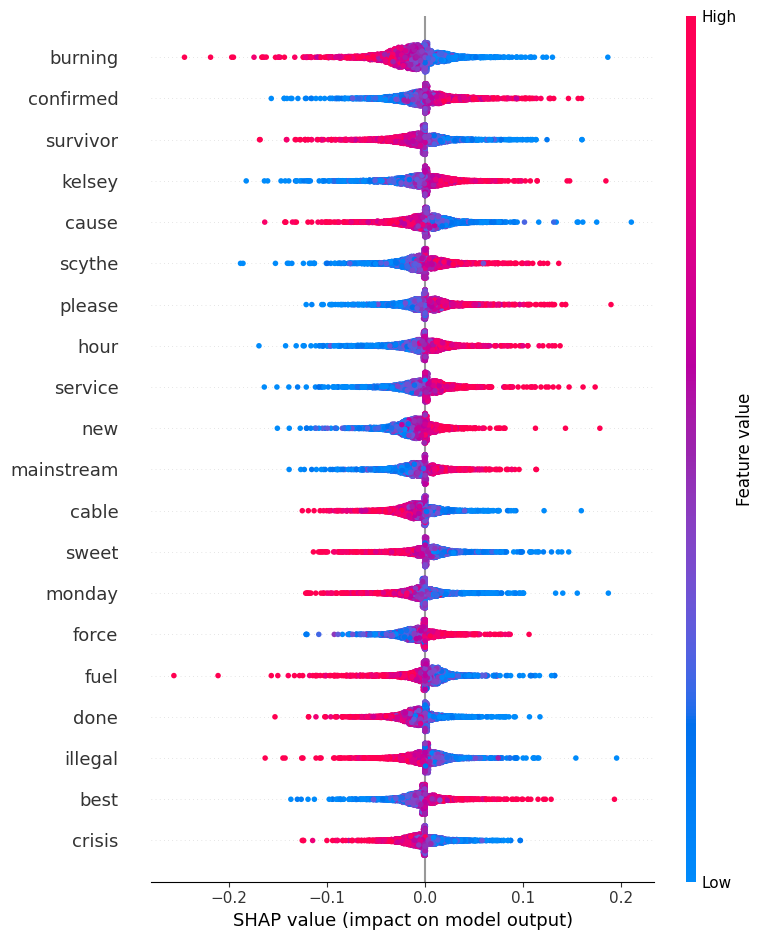


Sample extracted keywords from the test set (for the first 5 instances):

Sentence 1:
Original Text: many illegal building demolished city guadalajara enrique alfaro mitigation
Extracted Keywords: ['many', 'illegal', 'building', 'demolished', 'city', 'guadalajara', 'enrique', 'alfaro', 'mitigation']

Sentence 2:
Original Text: who fatality tho
Extracted Keywords: ['who', 'fatality', 'tho']

Sentence 3:
Original Text: onthisday chinese state medium confirmed iranian tanker sanchi sunk burning wee
Extracted Keywords: ['chinese', 'state', 'medium', 'confirmed', 'iranian', 'tanker', 'sanchi', 'sunk', 'burning', 'wee']

Sentence 4:
Original Text: luck miss windstorm either sidefly safe xxx
Extracted Keywords: ['luck', 'miss', 'windstorm', 'either', 'safe', 'xxx']

Sentence 5:
Original Text: inferno black friday death building much fuel lit hand man jonova
Extracted Keywords: ['inferno', 'black', 'friday', 'death', 'building', 'much', 'fuel', 'lit', 'hand', 'man']


In [13]:

import shap

# Ensure X_test_glove is a NumPy array if it's not already
if isinstance(X_test_glove, tuple):
    X_test_glove = np.array(X_test_glove)

# Sample the background data to reduce computation time (using nsamples, not K)
background_data = shap.sample(X_train_resampled, nsamples=100)  # Sample 100 background samples

# Initialize the SHAP explainer with the MLP model
explainer = shap.KernelExplainer(best_mlp_model.predict, background_data)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(np.array(X_test_glove))

# Create a mapping for feature names using the keywords extracted
feature_names = []
for keywords in X_test_keywords:
    feature_names.extend(keywords.keys())

# Generate a SHAP summary plot with meaningful feature names
shap.summary_plot(shap_values, features=np.array(X_test_glove), feature_names=feature_names)

# Print the extracted keywords for interpretation (for the first 5 instances)
print("\nSample extracted keywords from the test set (for the first 5 instances):")
for i in range(5):  # Print the first 5 test samples and their extracted keywords
    print(f"\nSentence {i + 1}:")
    print(f"Original Text: {X_test[i]}")
    print(f"Extracted Keywords: {list(X_test_keywords[i].keys())}")

In [22]:
# Import the necessary libraries
from sklearn.model_selection import RandomizedSearchCV  # Add this line to import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
import joblib

# Define the parameter grid for Decision Tree
param_grid_dt = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Initialize the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)

# Perform RandomizedSearchCV for hyperparameter tuning
random_search_dt = RandomizedSearchCV(dt_model, param_distributions=param_grid_dt,
                                      n_iter=10, cv=3, scoring='f1', verbose=1, n_jobs=-1, random_state=42)
random_search_dt.fit(X_train_resampled, y_train_resampled)

# Print the best parameters found by RandomizedSearchCV
print("Best parameters found for Decision Tree: ", random_search_dt.best_params_)

# Get the best model from RandomizedSearchCV
best_dt_model = random_search_dt.best_estimator_

# Predict and evaluate on the test set
y_test_pred_dt = best_dt_model.predict(X_test_glove)
print("Decision Tree Performance on Test Set:\n", classification_report(y_test, y_test_pred_dt))

# Calculate and print test accuracy
test_accuracy_dt = accuracy_score(y_test, y_test_pred_dt)
print(f"Test Accuracy with Decision Tree: {test_accuracy_dt:.4f}")

# Save the trained Decision Tree model to a file using joblib
model_filename_dt = 'decision_tree_model_with_smote.pkl'
joblib.dump(best_dt_model, model_filename_dt)
print(f"Trained Decision Tree model saved to {model_filename_dt}")


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters found for Decision Tree:  {'splitter': 'random', 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 50, 'criterion': 'entropy'}
Decision Tree Performance on Test Set:
               precision    recall  f1-score   support

           0       0.90      0.82      0.86      2808
           1       0.41      0.58      0.48       603

    accuracy                           0.78      3411
   macro avg       0.66      0.70      0.67      3411
weighted avg       0.81      0.78      0.79      3411

Test Accuracy with Decision Tree: 0.7775
Trained Decision Tree model saved to decision_tree_model_with_smote.pkl


In [23]:
import joblib
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Apply SMOTE to oversample the minority class in the training set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_glove, y_train)

# Define the parameter grid for XGBoost
param_grid_xgb = {
    'n_estimators': [50, 100, 200],  # Number of trees in the forest
    'max_depth': [3, 5, 7],  # Maximum depth of the trees
    'learning_rate': [0.01, 0.1, 0.2],  # Step size shrinkage used to prevent overfitting
    'subsample': [0.8, 1.0],  # Subsample ratio of the training instance
    'colsample_bytree': [0.8, 1.0],  # Subsample ratio of columns when constructing each tree
    'reg_alpha': [0, 0.01, 0.1],  # L1 regularization term on weights
    'reg_lambda': [0.01, 0.1, 1.0]  # L2 regularization term on weights
}

# Initialize the XGBoost model
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Perform RandomizedSearchCV for hyperparameter tuning
random_search_xgb = RandomizedSearchCV(xgb_model, param_distributions=param_grid_xgb,
                                       n_iter=10, cv=3, scoring='f1', verbose=1, n_jobs=-1, random_state=42)
random_search_xgb.fit(X_train_resampled, y_train_resampled)

# Print the best parameters found by RandomizedSearchCV
print("Best parameters found for XGBoost: ", random_search_xgb.best_params_)

# Get the best model from RandomizedSearchCV
best_xgb_model = random_search_xgb.best_estimator_

# Predict and evaluate on the test set
y_test_pred_xgb = best_xgb_model.predict(X_test_glove)
print("XGBoost Performance on Test Set:\n", classification_report(y_test, y_test_pred_xgb))

# Calculate and print test accuracy
test_accuracy_xgb = accuracy_score(y_test, y_test_pred_xgb)
print(f"Test Accuracy with XGBoost: {test_accuracy_xgb:.4f}")

# Save the trained XGBoost model to a file using joblib
model_filename = 'xgboost_model_with_smote.pkl'
joblib.dump(best_xgb_model, model_filename)
print(f"Trained XGBoost model saved to {model_filename}")

# -----------------------------------------------------
# Print the extracted keywords for interpretation
# -----------------------------------------------------
print("\nSample extracted keywords from the test set (for the first 5 instances):")
for i in range(5):  # Print the first 5 test samples and their extracted keywords
    print(f"\nSentence {i+1}:")
    print(f"Original Text: {X_test[i]}")
    print(f"Extracted Keywords: {list(X_test_keywords[i].keys())}")


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters found for XGBoost:  {'subsample': 1.0, 'reg_lambda': 0.01, 'reg_alpha': 0.1, 'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.2, 'colsample_bytree': 1.0}
XGBoost Performance on Test Set:
               precision    recall  f1-score   support

           0       0.94      0.94      0.94      2808
           1       0.72      0.70      0.71       603

    accuracy                           0.90      3411
   macro avg       0.83      0.82      0.82      3411
weighted avg       0.90      0.90      0.90      3411

Test Accuracy with XGBoost: 0.8983
Trained XGBoost model saved to xgboost_model_with_smote.pkl

Sample extracted keywords from the test set (for the first 5 instances):

Sentence 1:
Original Text: many illegal building demolished city guadalajara enrique alfaro mitigation
Extracted Keywords: ['many', 'illegal', 'building', 'demolished', 'city', 'guadalajara', 'enrique', 'alfaro', 'mitigation']

Sen

In [24]:
import joblib
import lightgbm as lgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Apply SMOTE to oversample the minority class in the training set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_glove, y_train)

# Define the parameter grid for LightGBM
param_grid_lgb = {
    'n_estimators': [50, 100, 200],  # Number of boosting iterations
    'num_leaves': [31, 50, 100],  # Maximum tree leaves for base learners
    'learning_rate': [0.01, 0.1, 0.2],  # Shrinks the contribution of each tree
    'subsample': [0.8, 1.0],  # Subsample ratio of the training instances
    'colsample_bytree': [0.8, 1.0],  # Subsample ratio of columns when constructing each tree
    'reg_alpha': [0, 0.01, 0.1],  # L1 regularization term on weights
    'reg_lambda': [0.01, 0.1, 1.0]  # L2 regularization term on weights
}

# Initialize LightGBM model
lgb_model = lgb.LGBMClassifier(objective='binary', random_state=42)

# Perform RandomizedSearchCV for hyperparameter tuning
random_search_lgb = RandomizedSearchCV(lgb_model, param_distributions=param_grid_lgb,
                                       n_iter=10, cv=3, scoring='f1', verbose=1, n_jobs=-1, random_state=42)
random_search_lgb.fit(X_train_resampled, y_train_resampled)

# Print the best parameters found by RandomizedSearchCV
print("Best parameters found for LightGBM: ", random_search_lgb.best_params_)

# Get the best model from RandomizedSearchCV
best_lgb_model = random_search_lgb.best_estimator_

# Save the trained LightGBM model to a .pkl file using joblib
model_filename = 'best_lgb_model.pkl'
joblib.dump(best_lgb_model, model_filename)
print(f"Trained LightGBM model saved to {model_filename}")

# Predict and evaluate on the test set
y_test_pred_lgb = best_lgb_model.predict(X_test_glove)
print("LightGBM Performance on Test Set:\n", classification_report(y_test, y_test_pred_lgb))

# Calculate and print test accuracy
test_accuracy_lgb = accuracy_score(y_test, y_test_pred_lgb)
print(f"Test Accuracy with LightGBM: {test_accuracy_lgb:.4f}")

# -----------------------------------------------------
# Print the extracted keywords for interpretation
# -----------------------------------------------------
print("\nSample extracted keywords from the test set (for the first 5 instances):")
for i in range(5):  # Print the first 5 test samples and their extracted keywords
    print(f"\nSentence {i+1}:")
    print(f"Original Text: {X_test[i]}")
    print(f"Extracted Keywords: {list(X_test_keywords[i].keys())}")


Fitting 3 folds for each of 10 candidates, totalling 30 fits
[LightGBM] [Info] Number of positive: 6448, number of negative: 6448
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 76500
[LightGBM] [Info] Number of data points in the train set: 12896, number of used features: 300
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

In [25]:
import joblib
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Define the parameter distribution for Gradient Boosting for RandomizedSearchCV
param_dist_gb = {
    'n_estimators': [50, 100, 200],  # Number of boosting stages
    'learning_rate': [0.01, 0.1, 0.2],  # Shrinkage rate
    'max_depth': [3, 5, 7],  # Maximum depth of the individual estimators
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],  # Minimum number of samples required at a leaf node
    'subsample': [0.8, 1.0],  # Fraction of samples used for fitting individual base learners
    'max_features': ['auto', 'sqrt', 'log2', None],  # Number of features to consider for the best split
}

# Apply SMOTE to oversample the minority class in the training set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_glove, y_train)

# Initialize Gradient Boosting model
gb_model = GradientBoostingClassifier(random_state=42)

# Use RandomizedSearchCV for hyperparameter tuning (faster than GridSearchCV)
random_search_gb = RandomizedSearchCV(gb_model, param_distributions=param_dist_gb,
                                      n_iter=10, cv=3, scoring='f1', verbose=1, n_jobs=-1, random_state=42)
random_search_gb.fit(X_train_resampled, y_train_resampled)

# Print the best parameters found by RandomizedSearchCV
print("Best parameters found for Gradient Boosting: ", random_search_gb.best_params_)

# Get the best model from RandomizedSearchCV
best_gb_model = random_search_gb.best_estimator_

# Save the trained Gradient Boosting model to a .pkl file using joblib
model_filename = 'best_gb_model_with_smote.pkl'
joblib.dump(best_gb_model, model_filename)
print(f"Trained Gradient Boosting model saved to {model_filename}")

# Predict and evaluate on the test set
y_test_pred_gb = best_gb_model.predict(X_test_glove)
print("Gradient Boosting with SMOTE Performance on Test Set:\n", classification_report(y_test, y_test_pred_gb))

# Calculate and print test accuracy
test_accuracy_gb = accuracy_score(y_test, y_test_pred_gb)
print(f"Test Accuracy: {test_accuracy_gb:.4f}")

# Predict and evaluate on the training set
y_train_pred_gb = best_gb_model.predict(X_train_glove)
print("Gradient Boosting with SMOTE Performance on Training Set:\n", classification_report(y_train, y_train_pred_gb))

# Calculate and print training accuracy
train_accuracy_gb = accuracy_score(y_train, y_train_pred_gb)
print(f"Training Accuracy: {train_accuracy_gb:.4f}")

# -----------------------------------------------------
# Print the extracted keywords for interpretation
# -----------------------------------------------------
print("\nSample extracted keywords from the test set (for the first 5 instances):")
for i in range(5):  # Print the first 5 test samples and their extracted keywords
    print(f"\nSentence {i+1}:")
    print(f"Original Text: {X_test[i]}")
    print(f"Extracted Keywords: {list(X_test_keywords[i].keys())}")


Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\rahul\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
9 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
7 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\rahul\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\rahul\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packag

KeyboardInterrupt: 

In [8]:
import joblib
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Define the parameter distribution for SVM for RandomizedSearchCV
param_dist_svm = {
    'C': [0.1, 1, 10, 100],  # Regularization strength
    'kernel': ['linear', 'rbf', 'poly'],  # Different kernel functions
    'gamma': ['scale', 'auto'],  # Kernel coefficient for 'rbf', 'poly'
}

# Apply SMOTE to oversample the minority class in the training set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_glove, y_train)

# Initialize SVM with class weights to handle imbalance and enable probability estimation
svm_model = SVC(class_weight={0: 1, 1: 3}, probability=True)

# Use RandomizedSearchCV for hyperparameter tuning (faster than GridSearchCV)
random_search_svm = RandomizedSearchCV(svm_model, param_distributions=param_dist_svm,
                                       n_iter=10, cv=3, scoring='f1', verbose=1, n_jobs=-1, random_state=42)
random_search_svm.fit(X_train_resampled, y_train_resampled)

# Print the best parameters found by RandomizedSearchCV
print("Best parameters found for SVM: ", random_search_svm.best_params_)

# Get the best model from RandomizedSearchCV
best_svm_model = random_search_svm.best_estimator_

# Save the trained SVM model to a .pkl file using joblib
model_filename = 'best_svm_model_with_prob.pkl'
joblib.dump(best_svm_model, model_filename)
print(f"Trained SVM model saved to {model_filename}")

# Predict and evaluate on the test set
y_test_pred_svm = best_svm_model.predict(X_test_glove)
print("SVM with SMOTE and Custom Class Weights Performance on Test Set:\n", classification_report(y_test, y_test_pred_svm))

# Calculate and print test accuracy
test_accuracy_svm = accuracy_score(y_test, y_test_pred_svm)
print(f"Test Accuracy: {test_accuracy_svm:.4f}")

# Predict and evaluate on the training set
y_train_pred_svm = best_svm_model.predict(X_train_glove)
print("SVM with SMOTE and Custom Class Weights Performance on Training Set:\n", classification_report(y_train, y_train_pred_svm))

# Calculate and print training accuracy
train_accuracy_svm = accuracy_score(y_train, y_train_pred_svm)
print(f"Training Accuracy: {train_accuracy_svm:.4f}")

# -----------------------------------------------------
# Print the extracted keywords for interpretation
# -----------------------------------------------------
print("\nSample extracted keywords from the test set (for the first 5 instances):")
for i in range(5):  # Print the first 5 test samples and their extracted keywords
    print(f"\nSentence {i+1}:")
    print(f"Original Text: {X_test[i]}")
    print(f"Extracted Keywords: {list(X_test_keywords[i].keys())}")


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters found for SVM:  {'kernel': 'rbf', 'gamma': 'scale', 'C': 10}
Trained SVM model saved to best_svm_model_with_prob.pkl
SVM with SMOTE and Custom Class Weights Performance on Test Set:
               precision    recall  f1-score   support

           0       0.93      0.95      0.94      2808
           1       0.74      0.67      0.71       603

    accuracy                           0.90      3411
   macro avg       0.84      0.81      0.82      3411
weighted avg       0.90      0.90      0.90      3411

Test Accuracy: 0.9009
SVM with SMOTE and Custom Class Weights Performance on Training Set:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6448
           1       0.99      1.00      0.99      1511

    accuracy                           1.00      7959
   macro avg       0.99      1.00      1.00      7959
weighted avg       1.00      1.00      1.00      

In [9]:
%pip install lime

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/12.9 MB ? eta -:--:--
    --------------------------------------- 0.3/12.9 MB ? eta -:--:--
   - -------------------------------------- 0.5/12.9 MB 2.8 MB/s eta 0:00:05
   -- ------------------------------------- 0.8/12.9 MB 1.7 MB/s eta 0:00:08
   --- ------------------------------------ 1.0/12.9 MB 1.2 MB/s eta 0:00:10
   --- ------------------------------------ 1.0/12.9 MB 1.2 MB/s eta 0:00:10
   ---- ----------------------------------- 1.3/12.9 MB 1.2 MB/s eta 0:00:10
   ---- ----------------------------------- 1.6/12.9 MB 1.1 MB/s eta 0:00:11
   ----- ---------------------------------- 1.8/12.9 MB 1.1 MB/s eta 0:00:11
   ----- ---------------------------------- 1.8/12.9 MB 1.1 MB/s eta 0:00:1

In [17]:
sample_idx = 5  # Example instance
print(f"Sample text at index {sample_idx}: {X_test[sample_idx]}")
sample_text = X_test[sample_idx]

Sample text at index 5: cause structural failure dorian


In [18]:
if sample_idx < len(X_test):
    print(f"Valid index: {sample_idx}")
else:
    print(f"Invalid index: {sample_idx}. X_test has {len(X_test)} samples.")


Valid index: 5


In [26]:
# Get the embeddings for the sample text
embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(sample_text), glove_vectors)[0]])

# Check predictions for different models
print("LightGBM Prediction Probabilities:", best_lgb_model.predict_proba(embeddings))
print("SVM Prediction Probabilities:", best_svm_model.predict_proba(embeddings))
print("MLP Prediction Probabilities:", best_mlp_model.predict_proba(embeddings))
# Similarly for other models...


LightGBM Prediction Probabilities: [[0.20583893 0.79416107]]
SVM Prediction Probabilities: [[0.21736372 0.78263628]]
MLP Prediction Probabilities: [[0.00147861 0.9985214 ]]


In [27]:
# LightGBM LIME Explanation
exp_lgb = explainer_lime.explain_instance(sample_text, lime_predict_proba_lgb, num_features=6)
exp_lgb.show_in_notebook(text=True)
exp_lgb.save_to_file('lime_lgb_explanation.html')

# You can repeat this for other models as well

In [28]:
import lime
import lime.lime_text
import numpy as np

# -----------------------------------------------------
# LIME Analysis for All Models
# -----------------------------------------------------

# Define the actual class names for LIME
class_names = ['Not Real Disaster', 'Real Disaster']

# Initialize LIME Text Explainer
explainer_lime = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Function to predict probabilities using models and FastText embeddings
def lime_predict_proba_lgb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_lgb_model.predict_proba(embeddings)

def lime_predict_proba_gb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_gb_model.predict_proba(embeddings)

def lime_predict_proba_svm(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_svm_model.predict_proba(embeddings)

def lime_predict_proba_mlp(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_mlp_model.predict_proba(embeddings)

def lime_predict_proba_xgb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_xgb_model.predict_proba(embeddings)

# Choose a sample instance from X_test
sample_idx = 6 # Example instance
sample_text = X_test[sample_idx]

# LightGBM LIME Explanation
exp_lgb = explainer_lime.explain_instance(sample_text, lime_predict_proba_lgb, num_features=6)
exp_lgb.show_in_notebook(text=True)
exp_lgb.save_to_file('lime_lgb_explanation.html')

# Gradient Boosting LIME Explanation
exp_gb = explainer_lime.explain_instance(sample_text, lime_predict_proba_gb, num_features=6)
exp_gb.show_in_notebook(text=True)
exp_gb.save_to_file('lime_gb_explanation.html')

# SVM LIME Explanation
exp_svm = explainer_lime.explain_instance(sample_text, lime_predict_proba_svm, num_features=6)
exp_svm.show_in_notebook(text=True)
exp_svm.save_to_file('lime_svm_explanation.html')

# MLP LIME Explanation
exp_mlp = explainer_lime.explain_instance(sample_text, lime_predict_proba_mlp, num_features=6)
exp_mlp.show_in_notebook(text=True)
exp_mlp.save_to_file('lime_mlp_explanation.html')

# XGBoost LIME Explanation
exp_xgb = explainer_lime.explain_instance(sample_text, lime_predict_proba_xgb, num_features=6)
exp_xgb.show_in_notebook(text=True)
exp_xgb.save_to_file('lime_xgb_explanation.html')


NameError: name 'best_gb_model' is not defined

In [37]:
import lime
import lime.lime_text
import numpy as np

# -----------------------------------------------------
# LIME Analysis for All Models
# -----------------------------------------------------

# Define the actual class names for LIME
class_names = ['Not Real Disaster', 'Real Disaster']

# Initialize LIME Text Explainer
explainer_lime = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Function to predict probabilities using models and FastText embeddings
def lime_predict_proba_lgb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_lgb_model.predict_proba(embeddings)

def lime_predict_proba_gb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_gb_model.predict_proba(embeddings)

def lime_predict_proba_svm(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_svm_model.predict_proba(embeddings)

def lime_predict_proba_mlp(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_mlp_model.predict_proba(embeddings)

def lime_predict_proba_xgb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_xgb_model.predict_proba(embeddings)

# Choose a sample instance from X_test
sample_idx = 24 # Example instance
sample_text = X_test[sample_idx]

# LightGBM LIME Explanation
exp_lgb = explainer_lime.explain_instance(sample_text, lime_predict_proba_lgb, num_features=6)
exp_lgb.show_in_notebook(text=True)
exp_lgb.save_to_file('lime_lgb_explanation.html')

# Gradient Boosting LIME Explanation
exp_gb = explainer_lime.explain_instance(sample_text, lime_predict_proba_gb, num_features=6)
exp_gb.show_in_notebook(text=True)
exp_gb.save_to_file('lime_gb_explanation.html')

# SVM LIME Explanation
exp_svm = explainer_lime.explain_instance(sample_text, lime_predict_proba_svm, num_features=6)
exp_svm.show_in_notebook(text=True)
exp_svm.save_to_file('lime_svm_explanation.html')

# MLP LIME Explanation
exp_mlp = explainer_lime.explain_instance(sample_text, lime_predict_proba_mlp, num_features=6)
exp_mlp.show_in_notebook(text=True)
exp_mlp.save_to_file('lime_mlp_explanation.html')

# XGBoost LIME Explanation
exp_xgb = explainer_lime.explain_instance(sample_text, lime_predict_proba_xgb, num_features=6)
exp_xgb.show_in_notebook(text=True)
exp_xgb.save_to_file('lime_xgb_explanation.html')


NameError: name 'best_gb_model' is not defined

In [36]:
import lime
import lime.lime_text
import numpy as np

# -----------------------------------------------------
# LIME Analysis for All Models
# -----------------------------------------------------

# Define the actual class names for LIME
class_names = ['Not Real Disaster', 'Real Disaster']

# Initialize LIME Text Explainer
explainer_lime = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Function to predict probabilities using models and FastText embeddings
def lime_predict_proba_lgb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_lgb_model.predict_proba(embeddings)

def lime_predict_proba_gb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_gb_model.predict_proba(embeddings)

def lime_predict_proba_svm(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_svm_model.predict_proba(embeddings)

def lime_predict_proba_mlp(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_mlp_model.predict_proba(embeddings)

def lime_predict_proba_xgb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_xgb_model.predict_proba(embeddings)

# Choose a sample instance from X_test
sample_idx = 62 # Example instance
sample_text = X_test[sample_idx]

# LightGBM LIME Explanation
exp_lgb = explainer_lime.explain_instance(sample_text, lime_predict_proba_lgb, num_features=6)
exp_lgb.show_in_notebook(text=True)
exp_lgb.save_to_file('lime_lgb_explanation.html')

# Gradient Boosting LIME Explanation
exp_gb = explainer_lime.explain_instance(sample_text, lime_predict_proba_gb, num_features=6)
exp_gb.show_in_notebook(text=True)
exp_gb.save_to_file('lime_gb_explanation.html')

# SVM LIME Explanation
exp_svm = explainer_lime.explain_instance(sample_text, lime_predict_proba_svm, num_features=6)
exp_svm.show_in_notebook(text=True)
exp_svm.save_to_file('lime_svm_explanation.html')

# MLP LIME Explanation
exp_mlp = explainer_lime.explain_instance(sample_text, lime_predict_proba_mlp, num_features=6)
exp_mlp.show_in_notebook(text=True)
exp_mlp.save_to_file('lime_mlp_explanation.html')

# XGBoost LIME Explanation
exp_xgb = explainer_lime.explain_instance(sample_text, lime_predict_proba_xgb, num_features=6)
exp_xgb.show_in_notebook(text=True)
exp_xgb.save_to_file('lime_xgb_explanation.html')


NameError: name 'best_gb_model' is not defined

In [35]:
import lime
import lime.lime_text
import numpy as np

# -----------------------------------------------------
# LIME Analysis for All Models
# -----------------------------------------------------

# Define the actual class names for LIME
class_names = ['Not Real Disaster', 'Real Disaster']

# Initialize LIME Text Explainer
explainer_lime = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Function to predict probabilities using models and FastText embeddings
def lime_predict_proba_lgb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_lgb_model.predict_proba(embeddings)

def lime_predict_proba_gb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_gb_model.predict_proba(embeddings)

def lime_predict_proba_svm(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_svm_model.predict_proba(embeddings)

def lime_predict_proba_mlp(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_mlp_model.predict_proba(embeddings)

def lime_predict_proba_xgb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_xgb_model.predict_proba(embeddings)

# Choose a sample instance from X_test
sample_idx = 36 # Example instance
sample_text = X_test[sample_idx]

# LightGBM LIME Explanation
exp_lgb = explainer_lime.explain_instance(sample_text, lime_predict_proba_lgb, num_features=6)
exp_lgb.show_in_notebook(text=True)
exp_lgb.save_to_file('lime_lgb_explanation.html')

# Gradient Boosting LIME Explanation
exp_gb = explainer_lime.explain_instance(sample_text, lime_predict_proba_gb, num_features=6)
exp_gb.show_in_notebook(text=True)
exp_gb.save_to_file('lime_gb_explanation.html')

# SVM LIME Explanation
exp_svm = explainer_lime.explain_instance(sample_text, lime_predict_proba_svm, num_features=6)
exp_svm.show_in_notebook(text=True)
exp_svm.save_to_file('lime_svm_explanation.html')

# MLP LIME Explanation
exp_mlp = explainer_lime.explain_instance(sample_text, lime_predict_proba_mlp, num_features=6)
exp_mlp.show_in_notebook(text=True)
exp_mlp.save_to_file('lime_mlp_explanation.html')

# XGBoost LIME Explanation
exp_xgb = explainer_lime.explain_instance(sample_text, lime_predict_proba_xgb, num_features=6)
exp_xgb.show_in_notebook(text=True)
exp_xgb.save_to_file('lime_xgb_explanation.html')


NameError: name 'best_gb_model' is not defined

In [34]:
import lime
import lime.lime_text
import numpy as np

# -----------------------------------------------------
# LIME Analysis for All Models
# -----------------------------------------------------

# Define the actual class names for LIME
class_names = ['Not Real Disaster', 'Real Disaster']

# Initialize LIME Text Explainer
explainer_lime = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Function to predict probabilities using models and FastText embeddings
def lime_predict_proba_lgb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_lgb_model.predict_proba(embeddings)

def lime_predict_proba_gb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_gb_model.predict_proba(embeddings)

def lime_predict_proba_svm(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_svm_model.predict_proba(embeddings)

def lime_predict_proba_mlp(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_mlp_model.predict_proba(embeddings)

def lime_predict_proba_xgb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_xgb_model.predict_proba(embeddings)

# Choose a sample instance from X_test
sample_idx = 5 # Example instance
sample_text = X_test[sample_idx]

# LightGBM LIME Explanation
exp_lgb = explainer_lime.explain_instance(sample_text, lime_predict_proba_lgb, num_features=6)
exp_lgb.show_in_notebook(text=True)
exp_lgb.save_to_file('lime_lgb_explanation.html')

# Gradient Boosting LIME Explanation
exp_gb = explainer_lime.explain_instance(sample_text, lime_predict_proba_gb, num_features=6)
exp_gb.show_in_notebook(text=True)
exp_gb.save_to_file('lime_gb_explanation.html')

# SVM LIME Explanation
exp_svm = explainer_lime.explain_instance(sample_text, lime_predict_proba_svm, num_features=6)
exp_svm.show_in_notebook(text=True)
exp_svm.save_to_file('lime_svm_explanation.html')

# MLP LIME Explanation
exp_mlp = explainer_lime.explain_instance(sample_text, lime_predict_proba_mlp, num_features=6)
exp_mlp.show_in_notebook(text=True)
exp_mlp.save_to_file('lime_mlp_explanation.html')

# XGBoost LIME Explanation
exp_xgb = explainer_lime.explain_instance(sample_text, lime_predict_proba_xgb, num_features=6)
exp_xgb.show_in_notebook(text=True)
exp_xgb.save_to_file('lime_xgb_explanation.html')


NameError: name 'best_gb_model' is not defined

In [30]:
# Get the actual label for the selected instance (sample_idx)
actual_label = y_test[sample_idx]  # Assuming y_test contains the actual labels

# Print the actual label
print(f"Actual label at index {sample_idx}: {'Real Disaster' if actual_label == 1 else 'Not Real Disaster'}")


Actual label at index 6: Real Disaster


In [31]:
# Get the model's predicted probabilities for the sample instance
predicted_probabilities = best_lgb_model.predict_proba([X_test_glove[sample_idx]])

# Print the predicted probabilities
print(f"Predicted probabilities: {predicted_probabilities}")

# The predicted label is the one with the highest probability
predicted_label = np.argmax(predicted_probabilities)
print(f"Predicted label: {'Real Disaster' if predicted_label == 1 else 'Not Real Disaster'}")


Predicted probabilities: [[0.20583893 0.79416107]]
Predicted label: Real Disaster


In [32]:
# Show the LIME explanation in a notebook
exp_lgb.show_in_notebook(text=True)


In [33]:
import lime
import lime.lime_text
import numpy as np

# -----------------------------------------------------
# LIME Analysis for All Models
# -----------------------------------------------------

# Define the actual class names for LIME
class_names = ['Not Real Disaster', 'Real Disaster']

# Initialize LIME Text Explainer
explainer_lime = lime.lime_text.LimeTextExplainer(class_names=class_names)

# Function to predict probabilities using models and FastText embeddings
def lime_predict_proba_lgb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_lgb_model.predict_proba(embeddings)

def lime_predict_proba_gb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_gb_model.predict_proba(embeddings)

def lime_predict_proba_svm(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_svm_model.predict_proba(embeddings)

def lime_predict_proba_mlp(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_mlp_model.predict_proba(embeddings)

def lime_predict_proba_xgb(texts):
    embeddings = np.array([get_glove_embedding_with_keywords(preprocess_text(t), glove_vectors)[0] for t in texts])
    return best_xgb_model.predict_proba(embeddings)

# Choose a sample instance from X_test
sample_idx = 5  # Example instance
sample_text = X_test[sample_idx]

# Step 1: Check Actual Label
actual_label = y_test[sample_idx]  # Assuming y_test contains the actual labels
print(f"Sample text at index {sample_idx}: {sample_text}")
print(f"Actual label at index {sample_idx}: {'Real Disaster' if actual_label == 1 else 'Not Real Disaster'}")

# Step 2: Check Model's Probability Prediction
# Get the model's predicted probabilities for the sample instance
predicted_probabilities = best_lgb_model.predict_proba([X_test_glove[sample_idx]])
predicted_label = np.argmax(predicted_probabilities)

# Print the predicted probabilities and label
print(f"Predicted probabilities: {predicted_probabilities}")
print(f"Predicted label: {'Real Disaster' if predicted_label == 1 else 'Not Real Disaster'}")

# Step 3: Examine LIME Explanation
# LightGBM LIME Explanation
exp_lgb = explainer_lime.explain_instance(sample_text, lime_predict_proba_lgb, num_features=6)
exp_lgb.show_in_notebook(text=True)
exp_lgb.save_to_file('lime_lgb_explanation.html')

# Gradient Boosting LIME Explanation
exp_gb = explainer_lime.explain_instance(sample_text, lime_predict_proba_gb, num_features=6)
exp_gb.show_in_notebook(text=True)
exp_gb.save_to_file('lime_gb_explanation.html')

# SVM LIME Explanation
exp_svm = explainer_lime.explain_instance(sample_text, lime_predict_proba_svm, num_features=6)
exp_svm.show_in_notebook(text=True)
exp_svm.save_to_file('lime_svm_explanation.html')

# MLP LIME Explanation
exp_mlp = explainer_lime.explain_instance(sample_text, lime_predict_proba_mlp, num_features=6)
exp_mlp.show_in_notebook(text=True)
exp_mlp.save_to_file('lime_mlp_explanation.html')

# XGBoost LIME Explanation
exp_xgb = explainer_lime.explain_instance(sample_text, lime_predict_proba_xgb, num_features=6)
exp_xgb.show_in_notebook(text=True)
exp_xgb.save_to_file('lime_xgb_explanation.html')


Sample text at index 5: cause structural failure dorian
Actual label at index 5: Not Real Disaster
Predicted probabilities: [[9.99610001e-01 3.89999434e-04]]
Predicted label: Not Real Disaster


NameError: name 'best_gb_model' is not defined